In [1]:
import time
import numpy as np
import dxchange
from utils import nor_phase
from ganrec2 import *
import os
from lib import visualize
#use gpu 2
os.environ["CUDA_VISIBLE_DEVICES"]="1"
#use cpu
#os.environ["CUDA_VISIBLE_DEVICES"]=""
import tensorflow as tf
from ganrec1 import *
import skimage.io as io
import quantities as pq
from skimage.transform import resize


/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.3.0 and strictly below 2.6.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.9.3 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [2]:
from models import *
def make_generator_atan(img_h, img_w, conv_num, conv_size, dropout, output_num):
    units = 128
    fc_size = img_h * img_w

    fc_stack = [
        dense_norm(units, dropout),
        dense_norm(units, dropout),
        dense_norm(units, dropout),
        dense_norm(fc_size, 0),
    ]

    conv_stack = [
        conv2d_norm(conv_num, conv_size+2, 1),
        conv2d_norm(conv_num, conv_size+2, 1),
        conv2d_norm(conv_num, conv_size, 1),
    ]

    dconv_stack = [
        dconv2d_norm(conv_num, conv_size+2, 1),
        dconv2d_norm(conv_num, conv_size+2, 1),
        dconv2d_norm(conv_num, conv_size, 1),
    ]
    last_1 = conv2d_norm(output_num + 1, 3, 1)
    last = conv2d_norm(output_num, 3, 1)

    def tanh_on_first_two(x):
        x = Activation('tanh')(x[:, :, :, :2])
        return tf.reshape(x, [1, img_h, img_w, 2])
    
    def relu_on_last(x):
        x = Activation('relu')(x[:, :, :, 2])
        return tf.reshape(x, [1, img_h, img_w, 1])
    
    def only_layer(x, i):
        return tf.reshape(x[:, :, :, i], [1, img_h, img_w, 1])

    inputs = Input(shape=(img_h, img_w, 1))
    x = Flatten()(inputs)
    for fc in fc_stack:
        x = fc(x)

    x = tf.reshape(x, shape=[-1, img_h, img_w, 1])
    # Convolutions
    for conv in conv_stack:
        x = conv(x)
        
    for dconv in dconv_stack:
        x = dconv(x)

    if output_num > 2:
        x = last_1(x)
        x = [tanh_on_first_two(x), only_layer(x, 2)]
        phase = tf.atan2(x[0][0, :, :, 0], x[0][0, :, :, 1])
        phase = (tf.reshape(phase, [1, img_h, img_w, 1]))
        absorption = (tf.reshape((x[1][0, :, :, 0]), [1, img_h, img_w, 1]))
        x = tf.concat([phase, absorption], axis=3)

    x = last(x)
    if output_num == 2:
        model = Model(inputs=inputs, outputs=x)
    else:
        model = Model(inputs=inputs, outputs=x)
        # model = Model(inputs=inputs, outputs=[(tf.reshape(Activation('tanh')(x[0, :, :, :2]), [1, img_h, img_w, 2])), (tf.reshape((x[0, :, :, 2]), [1, img_h, img_w, 1]))])
    return model



In [3]:
def _get_GANphase_kwargs():
    return{
        'iter_num': 1000,
        'conv_num': 32,
        'conv_size': 3,
        'dropout': 0.25,
        'l1_ratio': 10,
        'abs_ratio': 0.05,
        'g_learning_rate': 1e-3,
        'd_learning_rate': 1e-5,
        'phase_only': False,
        'save_wpath': None,
        'init_wpath': None,
        'init_model': True,
        'save_model': False,
        'recon_monitor': True,
        'output_num': 2,
        'filter_type': 'median',
        'internal_iter': 3,
        'last_retrieval': False,
    }

def phase_fresnel(phase, absorption, ff, px):
    paddings = tf.constant([[px // 2, px // 2], [px // 2, px // 2]])
    # padding1 = tf.constant([[px // 2, px // 2], [0, 0]])
    # padding2 = tf.constant([[0, 0], [px // 2, px // 2]])
    pvalue = tf.reduce_mean(phase[:100, :])
    # phase = tf.pad(phase, paddings, 'CONSTANT',constant_values=1)
    phase = tf.pad(phase, paddings, 'SYMMETRIC')
    # phase = tf.pad(phase, paddings, 'REFLECT')
    absorption = tf.pad(absorption, paddings, 'SYMMETRIC')
    # phase = phase
    # absorption = absorption
    abfs = tf.complex(-absorption, phase)
    abfs = tf.exp(abfs)
    ifp = tf.abs(tf.signal.ifft2d(ff * tf.signal.fft2d(abfs))) ** 2
    ifp = tf.reshape(ifp, [ifp.shape[0], ifp.shape[1], 1])
    ifp = tf.image.central_crop(ifp, 0.5)
    ifp = tf.image.per_image_standardization(ifp)
    ifp = tf.reshape(ifp, [1, ifp.shape[0], ifp.shape[1], 1])
    # ifp = tfnor_phase(ifp)
    return ifp

class GANphase:
    def __init__(self, i_input, energy, z, pv, **kwargs):
        phase_args = _get_GANphase_kwargs()
        phase_args.update(**kwargs)
        super(GANphase, self).__init__()
        self.i_input = i_input
        self.px, self.py = i_input.shape
        self.energy = energy
        self.z = z
        self.pv = pv
        self.internal_iter = kwargs['internal_iter']
        self.last_retrieval = kwargs['last_retrieval']
        self.iter_num = phase_args['iter_num']
        self.conv_num = phase_args['conv_num']
        self.conv_size = phase_args['conv_size']
        self.dropout = phase_args['dropout']
        self.l1_ratio = phase_args['l1_ratio']
        self.abs_ratio = phase_args['abs_ratio']
        self.g_learning_rate = phase_args['g_learning_rate']
        self.d_learning_rate = phase_args['d_learning_rate']
        self.phase_only = phase_args['phase_only']
        self.save_wpath = phase_args['save_wpath']
        self.init_wpath = phase_args['init_wpath']
        self.init_model = phase_args['init_model']
        self.save_model = phase_args['save_model']
        self.recon_monitor = phase_args['recon_monitor']
        self.filter_type = phase_args['filter_type']
        self.output_num = phase_args['output_num']
        self.filter = None
        self.generator = None
        self.discriminator = None
        self.filter_optimizer = None
        self.generator_optimizer = None
        self.discriminator_optimizer = None

    def make_model(self):
        self.filter = make_filter(self.i_input.shape[0],
                                  self.i_input.shape[1])
        self.generator = make_generator_atan(self.i_input.shape[0],
                                        self.i_input.shape[1],
                                        self.conv_num,
                                        self.conv_size,
                                        self.dropout,
                                        self.output_num)
        self.discriminator = make_discriminator(self.i_input.shape[0],
                                                self.i_input.shape[1])
        self.filter_optimizer = tf.keras.optimizers.Adam(5e-3)
        self.generator_optimizer = tf.keras.optimizers.Adam(self.g_learning_rate)
        self.discriminator_optimizer = tf.keras.optimizers.Adam(self.d_learning_rate)

    def make_chechpoints(self):
        checkpoint_dir = '/data/ganrec/training_checkpoints'
        checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
        checkpoint = tf.train.Checkpoint(generator_optimizer=self.generator_optimizer,
                                         discriminator_optimizer=self.discriminator_optimizer,
                                         generator=self.generator,
                                         discriminator=self.discriminator)

    @tf.function
    def rec_step(self, i_input, ff, phase_input = None, absorption_input = None):
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            recon = self.generator(i_input)
        
            #change from list to tensor
            if type(recon) == list:
                print(len(recon), recon[0].shape, recon[1].shape)
                sin_phase = recon[0][0, :, :, 0]
                cos_phase = recon[0][0, :, :, 1]
                self.phase = tf.atan2(sin_phase, cos_phase)
                phase = tf.reshape(self.phase, [1, self.px, self.py,1])
                self.absorption = recon[1][0, :, :, 0]
                absorption = (tfnor_phase(tf.reshape(self.absorption, [1, self.px, self.py, 1])) )* self.abs_ratio
            
                phase = tf.reshape((phase), [self.px, self.py])
                absorption = tf.reshape((absorption), [self.px, self.py])
                # i_rec = phase_fresnel(phase, absorption, ff, self.px)
                i_rec = phase_fresnel_2(cos_phase, sin_phase, absorption, ff, self.px)
            else:   
                self.phase = recon[:, :, :, 0]
                self.absorption = recon[:, :, :, 1]
                phase = tfnor_phase(tf.reshape(recon[:, :, :, 0], [1, self.px, self.py, 1]))
                absorption = (1 - tfnor_phase(tf.reshape(recon[:, :, :, 1], [1, self.px, self.py, 1])) )* self.abs_ratio
                phase = tf.reshape(phase, [self.px, self.py])
                absorption = tf.reshape(absorption, [self.px, self.py])
            
                if self.phase_only:
                    absorption = tf.zeros_like(phase)
                i_rec = phase_fresnel(phase, absorption, ff, self.px)
            # i_rec = phase_fresnel_2(tf.reshape((recon[:, :, :, 0]), [self.px, self.py]), tf.reshape((recon[:, :, :, 1]), [self.px, self.py]), tf.reshape(tfnor_phase(recon[:, :, :, 2]), [self.px, self.py]), ff, self.px)
        

            real_output = self.discriminator(i_input, training=True)
            fake_output = self.discriminator(i_rec, training=True)
            if phase_input is not None and absorption_input is not None:
                #change their shape
                phase_input = tf.reshape(phase_input, [1, self.px, self.py, 1])
                absorption_input = tf.reshape(absorption_input, [1, self.px, self.py, 1])
                phase = tf.reshape(phase, [1, self.px, self.py, 1])
                absorption = tf.reshape(absorption, [1, self.px, self.py, 1])
                #discremenate between the real phase and the generated phase, and the real absorption and the generated absorption and the real intensity and the generated intensity
                real_output_phase = self.discriminator(phase_input, training=True)
                fake_output_phase = self.discriminator(phase, training=True)
                real_output_abs = self.discriminator(absorption_input, training=True)
                fake_output_abs = self.discriminator(absorption, training=True)
                real_output_i = self.discriminator(i_input, training=True)
                fake_output_i = self.discriminator(i_rec, training=True)
                # fake_output_i_2 = self.discriminator(i_rec_2, training=True)

                g_loss = generator_loss(fake_output_i, i_input, i_rec, self.l1_ratio) + \
                            generator_loss(fake_output_phase, phase_input, phase, self.l1_ratio) + \
                            generator_loss(fake_output_abs, absorption_input, absorption, self.l1_ratio)
                            # generator_loss(fake_output_i_2, i_input, i_rec_2, self.l1_ratio)
                            
                
                d_loss = discriminator_loss(real_output, fake_output) + \
                        discriminator_loss(real_output_phase, fake_output_phase) + \
                            discriminator_loss(real_output_abs, fake_output_abs) + \
                            discriminator_loss(real_output_i, fake_output_i)
                                # discriminator_loss(real_output_i, fake_output_i_2)
                    
                
            else:
                g_loss = generator_loss(fake_output, i_input, i_rec, self.l1_ratio)
                d_loss = discriminator_loss(real_output, fake_output)

        gradients_of_generator = gen_tape.gradient(g_loss,
                                                   self.generator.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(d_loss,
                                                        self.discriminator.trainable_variables)
        self.generator_optimizer.apply_gradients(zip(gradients_of_generator,
                                                     self.generator.trainable_variables))
        self.discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator,
                                                         self.discriminator.trainable_variables))
        


        return {'phase':  tf.reshape(phase, [self.px, self.py]),
                'absorption': tf.reshape(absorption, [self.px, self.py]),
                'i_rec': i_rec,
                'g_loss': g_loss,
                'd_loss': d_loss,
                'recon':recon}


    def multi_propagation(self, i_input, ffs, retrieved_phase = None, retrieved_absorption = None, filter_type = None):
        if retrieved_phase is not None and retrieved_absorption is not None:
            if filter_type is None:
                filter_type = self.filter_type

            if filter_type == 'median':
                # filter the phase and absorption
                filtered_phase = median_filter2d( tf.reshape(retrieved_phase, [1, self.px, self.py, 1]))[0, :, :, 0]
                filtered_absorption = median_filter2d( tf.reshape(retrieved_absorption, [1, self.px, self.py, 1]))[0, :, :, 0]
                step_results = [self.rec_step(phase_fresnel(filtered_phase, filtered_absorption, ffs[i], self.px), ffs[i], phase_input = filtered_phase, absorption_input = filtered_absorption) for i in range(1, len(ffs))]
            if filter_type == 'contrast':
                # add contrast to the phase and absorption
                filtered_phase = (retrieved_phase - tf.reduce_min(retrieved_phase))/ (tf.reduce_max(retrieved_phase) - tf.reduce_min(retrieved_phase))
                filtered_absorption = (retrieved_absorption - tf.reduce_min(retrieved_absorption))/ (tf.reduce_max(retrieved_absorption) - tf.reduce_min(retrieved_absorption))
                step_results = [self.rec_step(phase_fresnel(filtered_phase, filtered_absorption, ffs[i], self.px), ffs[i], phase_input = filtered_phase, absorption_input = filtered_absorption) for i in range(1, len(ffs))]
            
            if filter_type == 'noise':
                # add noise to the phase and absorption
                filtered_phase = retrieved_phase + tf.random.normal(retrieved_phase.shape, mean=0.0, stddev=0.1, dtype=tf.float32)
                filtered_absorption = retrieved_absorption + tf.random.normal(retrieved_absorption.shape, mean=0.0, stddev=0.1, dtype=tf.float32)
                step_results = [self.rec_step(phase_fresnel(filtered_phase, filtered_absorption, ffs[i], self.px), ffs[i], phase_input = filtered_phase, absorption_input = filtered_absorption) for i in range(1, len(ffs))]
            if filter_type == 'diffuse':
                # diffuse
                # ffs = [ffs[0]]*5
                sigma_coeff = list(np.arange(0.9, 1.1, 0.2))
                ffs = [ffs[0]]*len(sigma_coeff)
                filtered_phases = [diffusion_layer(tf.reshape(retrieved_phase, [1, self.px, self.py, 1]), sigma=sigma_coeff[i])[0, :, :, 0] for i in range(len(sigma_coeff))]
                filtered_absorptions = [diffusion_layer(tf.reshape(retrieved_absorption, [1, self.px, self.py, 1]), sigma=sigma_coeff[i])[0, :, :, 0] for i in range(len(sigma_coeff))]
                step_results = [self.rec_step(phase_fresnel(filtered_phases[i], filtered_absorptions[i], ffs[0], self.px), ffs[0], phase_input = filtered_phases[i], absorption_input = filtered_absorptions[i]) for i in range(len(sigma_coeff))]
            if filter_type == 'phase_only':
                # diffuse
                sigma_coeff = list(np.arange(0.5, 0.5*len(ffs), 0.5))
                filtered_phases = [diffusion_layer(tf.reshape(retrieved_phase, [1, self.px, self.py, 1]), sigma=sigma_coeff[i])[0, :, :, 0] for i in range(len(sigma_coeff))]
                filtered_absorption = np.zeros_like(filtered_phases[0])
                step_results = [self.rec_step(phase_fresnel(filtered_phases[i], filtered_absorption, ffs[i], self.px), ffs[i], phase_input = filtered_phases[i], absorption_input = filtered_absorption) for i in range(len(sigma_coeff))]
            if filter_type == 'alternate':
                step_results = [self.rec_step(phase_fresnel(retrieved_phase, retrieved_absorption, ffs[i], self.px), ffs[i], phase_input = retrieved_phase, absorption_input = retrieved_absorption) for i in range(1, len(ffs))]                
        else:
            step_results = self.rec_step(i_input, ffs[0])
        return step_results
    
    @property
    def recon(self):
        ff = ffactor(self.px * 2, self.py *2, self.energy, self.z, self.pv)
        ffs = []
        
        ffs.append(ff)
        # for i in range(1, self.internal_iter):
            # z_i = self.z * (1 + 1/i)
            # ffs.append(ffactor(self.px * 2, self.py *2, self.energy, z_i, self.pv))
        for i in range(1, self.internal_iter):
            z_i = self.z / (1 + 1/i)
            ffs.append(ffactor(self.px * 2, self.py *2, self.energy, z_i, self.pv))
        ffs.append(ff)
        # print(ff.shape, ff.max(), ff.min())

        i_input = np.reshape(self.i_input, (1, self.px, self.py, 1))
        i_input = tf.cast(i_input, dtype=tf.float32)
        self.make_model()

        if self.init_model:
            self.generator.load_weights(self.init_wpath+'generator.h5')
            print('generator is initilized')
            self.discriminator.load_weights(self.init_wpath+'discriminator.h5')
            print('discriminator is initilized')

        phase = np.zeros((self.iter_num, self.px, self.py))
        absorption = np.zeros((self.iter_num, self.px, self.py))
        gen_loss = np.zeros(self.iter_num)
        i_rec_all = np.zeros((self.iter_num, self.px, self.py))

        ###########################################################################
        # Reconstruction process monitor
        
        plot_x, plot_loss = [], []
        if self.recon_monitor:
            recon_monitor = RECONmonitor('phase')
            recon_monitor.initial_plot(self.i_input)

        side_propagation = []
        ###########################################################################
        for epoch in range(self.iter_num):

            ###########################################################################
            ## Call the rconstruction step
            
            step_results = self.rec_step(i_input, ffs[0])
            side_propagation.append(step_results['recon'])
            # side_propagation = list(tfnor_phase(tf.stack(side_propagation, axis = 0)))
            # print('epoch: {}, g_loss: {}, d_loss: {}'.format(epoch, step_results['g_loss'], step_results['d_loss']))

            if self.last_retrieval:
                if epoch % 100 == 0:
                    retrieved_phase = step_results['phase']
                    retrieved_absorption = step_results['absorption']
                    step_result_i = self.multi_propagation(i_input, ffs, retrieved_phase, retrieved_absorption, filter_type = self.filter_type)
                    # step_result_i = self.rec_step(median_filter2d(i_input), ff)    
                
            phase[epoch, :, :] = step_results['phase']
            absorption[epoch, :, :] = step_results['absorption']
            i_rec = step_results['i_rec']
            i_rec_all[epoch, :, :] = np.reshape(i_rec, (self.px, self.py))
            gen_loss[epoch] = step_results['g_loss']
            d_loss = step_results['d_loss']
            ###########################################################################
                
            plot_x.append(epoch)
            plot_loss = gen_loss[:epoch + 1]

            if (epoch + 1) % self.iter_num == 0:
                # checkpoint.save(file_prefix=checkpoint_prefix)
                if self.recon_monitor:  
                    i_rec = np.reshape(i_rec, (self.px, self.py))
                    i_diff = np.abs(i_rec - np.reshape(self.i_input, (self.px, self.py)))
                    phase_plt = np.reshape(phase[epoch], (self.px, self.py))
                    recon_monitor.update_plot(epoch, i_diff, phase_plt, plot_x, plot_loss)
        if self.recon_monitor:
            recon_monitor.close_plot()

        if self.save_model:
            self.generator.save(self.save_wpath+'generator.h5')
            self.discriminator.save(self.save_wpath+'discriminator.h5')

        return absorption[epoch], phase[epoch], i_rec_all[epoch], gen_loss, side_propagation


# Retrieving the sphere

In [5]:
import quantities as pq
simulation_phase = '/beegfs/desy/user/jentscht/for_dawit/groundtruth/ratio_phase_attenuation_ratio_1e-1_double_sphere_30000_eV/ground_truth_projection/ground_truth_projection_phase_30000_eV_00097_type_float32_8192x8192.tif'
simulation_attenuation = '/beegfs/desy/user/jentscht/for_dawit/groundtruth/ratio_phase_attenuation_ratio_1e-1_double_sphere_30000_eV/ground_truth_projection/ground_truth_projection_attenuation_30000_eV_00097_type_float32_8192x8192.tif'
energy = 30 * pq.keV
lam = wavelength_from_energy(energy)
fresnel_nummber = 0.0005 * pq.dimensionless
z = 2.0 * pq.meter
pv = np.sqrt(fresnel_nummber * lam * z) #array(8.39314161e-06) * m

phase_image_orig = dxchange.read_tiff(simulation_phase)
attenuation_image_orig = dxchange.read_tiff(simulation_attenuation)



In [6]:
phase_image_orig = phase_image_orig * 2 * np.pi / lam.magnitude
attenuation_image_orig = attenuation_image_orig * 2 * np.pi / lam.magnitude

In [9]:

phase_image = 1 - nor_phase(phase_image_orig)/np.max(nor_phase(phase_image_orig))
attenuation_image = 1 - nor_phase(attenuation_image_orig)/np.max(nor_phase(attenuation_image_orig))

px, py = phase_image.shape
print(px, py)

kwargs = {
    'iter_num': 400,
    'internal_iter': 3,
    'last_retrieval': False,
    'save_wpath': 'data/gan_phase/spheres/',
    'init_wpath': 'data/gan_phase/spheres/',
    'init_model': False,
    'save_model': False,
    'filter_type': 'median', #chose from median, contrast, noise, diffuse, phase_only, alternate
    'output_num': 2,
    'phase_only': False,
    'recon_monitor': True,
}

kwargs.update({
    'energy': energy.magnitude,
    'z': z.magnitude,
    'pv': pv.magnitude,
    'idx': 0,
    'abs_ratio': 0.5,
    'px': px,
    'py': py,
})


given_phase = phase_image
cos, sin = np.cos(given_phase), np.sin(given_phase)
given_absorption = (1 - attenuation_image) * kwargs['abs_ratio']
given_absorption = resize(given_absorption, (px, py))

different_distances = list(np.arange(0, kwargs['z'], 0.9))
# ffs = [ffactor(px * 2, py *2, kwargs['energy'], distance, kwargs['pv']) for distance in different_distances]
ffs = ffactors(px * 2, py *2, kwargs['energy'], different_distances, kwargs['pv'])
propagated_images = [nor_phase(phase_fresnel(phase_image_orig, attenuation_image_orig, ffs[i], px)) for i in range(len(ffs))]


8192 8192


In [10]:
e
px, py = phase_image.shape
px = px // 16
py = py // 16
given_phase = resize(given_phase, (px, py))
given_absorption = resize(given_absorption, (px, py))
kwargs[pv] = pv.magnitude // 16
kwargs['px'] = px
kwargs['py'] = py
propagated_images = [resize(propagated_images[i], (px, py)) for i in range(len(ffs))]

from visualize import visualize
visualize([propagated_images[-1].numpy()], show_or_plot = 'both', cmap = 'gray', title = 'propagated image')

NameError: name 'e' is not defined

In [11]:
from visualize import visualize
visualize([propagated_images[-1].numpy()], show_or_plot = 'both', cmap = 'gray', title = 'propagated image')

rows:  1 cols:  1


# Retrieving Magnisium corrossion data

>Source: <b> from Johannes Hagemann </b>
>working_path: '/asap3/petra3/gpfs/p05/2020/data/11010216/processed/nano3649_holotomo_Mg2Ag_corr_1/'
>files: {4×1 cell}
>prepath: '/asap3/petra3/gpfs/p05/2020/data/'
>run: '11010216/'
>sample: 'nano3649_holotomo_Mg2Ag_corr_1'


rows:  1 cols:  1


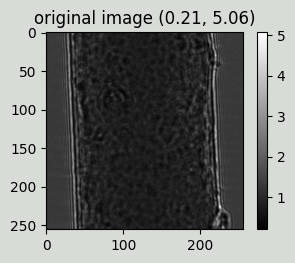

In [5]:
from skimage.transform import resize
image = io.imread('/home/hailudaw/hailudaw/git_folders/ganrec/ganrectorch/data/JH/test_data_nano3649_holotomo_Mg2Ag_corr_1_130_angle.tiff')
downsampling_factor = 8
image = resize(image, (image.shape[0]//downsampling_factor, image.shape[1]//downsampling_factor))
px, py = image.shape
f = visualize([image], title='original image', cmap='gray')

In [6]:
save_path = "/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/jh/"

jh ={
    'experiment_name': 'nano3649_holotomo_Mg2Ag_corr_1',
    'path': image,
    'fresnel_number': 0.003,#5.3037e-04,
    # 'distance_sample_detector': 5.1950e+08 ,
    # 'detector_pixel_size': 176.5424 ,
    # 'z02': 1.9661e+10, 
    # 'z01': [534000000, 536000000][0],
    # 'z12': [1.9127e+10, 1.9125e+10][0],
    # 'z_eff': [5.1950e+08, 5.2139e+08][0],
    # 'dxeff': [176.5424, 177.2036][0],
    # 'M': [36.8184, 36.6810],
    # 'F_calc': [5.3230e-04, 5.3435e-04][0],
    # 'F_rescaled': [5.3230e-04, 5.3037e-04][0],
}

kwargs = {
    'iter_num': 400,
    'internal_iter': 3,
    'last_retrieval': False,
    'save_wpath': 'jh/',
    'init_wpath': 'jh/',
    'init_model': False,
    'save_model': False,
    'filter_type': 'median', #chose from median, contrast, noise, diffuse, phase_only, alternate
    'output_num': 2,
    'phase_only': False,
    'recon_monitor': True,
}

kwargs.update({
    'experiment_name': 'nano3649_holotomo_Mg2Ag_corr_1',
    'energy': 11,
    'z': 5.2139e-1,
    'pv': 177.2036 *1e-9 * downsampling_factor,
    'idx': 0,
    'abs_ratio': 0.00001,
    'px': px,
    'py': py,
})

# Run GanRec to get the phase of the Magnisium

2023-12-10 17:30:46.519747: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-10 17:30:49.121769: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20545 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:81:00.0, compute capability: 8.6
2023-12-10 17:30:58.590225: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8500
2023-12-10 17:31:05.430967: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


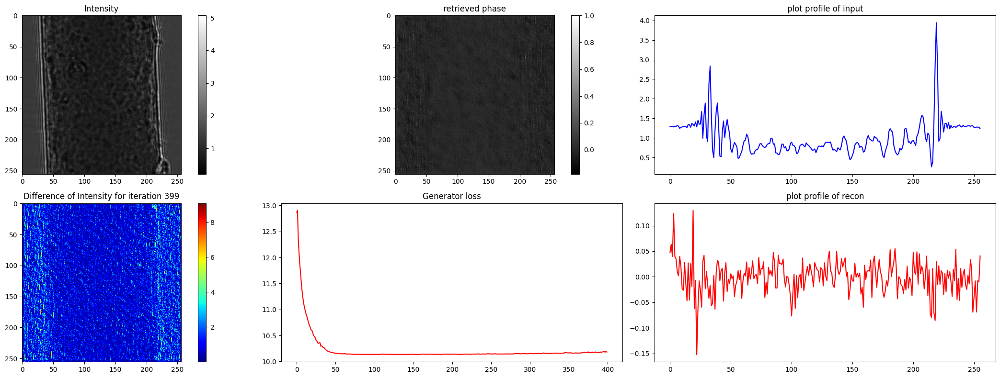

rows:  1 cols:  3


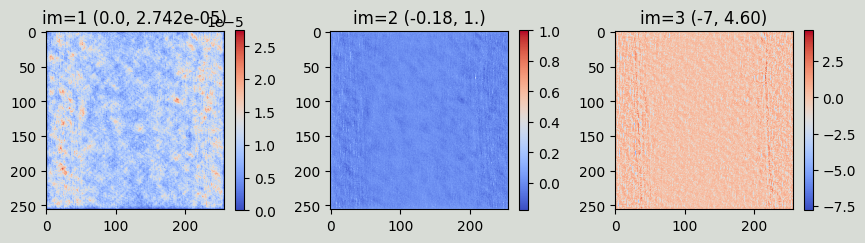

,0,0.1,0.2,0.3,0.4,0.5,0.6,0
experiment_name,Mg_corr0.05,Mg_corr0.05,Mg_corr1,Mg_corr1e-05,Mg_corr1e-05,Mg_corr1e-05,Mg_corr1e-05,Mg_corr1e-05
iter,1400,1400,1400,1400,1400,400,400,400
sum of pointwise difference,-517.87036,-517.8688,-258.93884,-258.93723,-258.9383,-258.93842,-258.93784,-258.937988
sum of absolute value of pointwise difference,531.57825,532.70447,261.5197,267.33557,271.2887,270.35632,259.13892,259.228882
sum of squared difference,1135.0992,1142.3887,475.60443,561.51733,558.24005,522.7186,531.5305,530.374268
PSNR,[-3.4576385],[-3.485439],[-2.6900592],[-3.4112318],[-3.3858101],[-3.10028],[-3.1728823],[-3.1634247]
SSIM,[0.01263618],[0.00582094],[0.00551312],[0.00119003],[0.00069151],[0.00743675],[0.0059085],[0.0062645194]
NRMSE,33.691235,33.79924,21.808357,23.696356,23.627104,22.86304,23.054945,23.029856
MSSIM,[0.04842967],[0.05072053],[0.],[0.05035024],[0.02386974],[0.],[0.0781856],[0.10217962]
epoch_time,71.61399722099304,72.0445237159729,62.25317597389221,68.94961023330688,70.82691168785095,48.788692235946655,16.569151163101196,41.309509


In [7]:
from ganrec_dataloader import measure_reconstruction_quality, tf_reshape

gan_phase_object = GANphase(image, **kwargs)
start = time.time()
absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
end = time.time()
time_count = end - start
visualize([absorption, phase, propagated])#, matched, data[idx], idx, abs_ratio, kwargs['iter_num'])
# io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/phase/phase_'+str(idx)+'_'+str(abs_ratio)+'.tif', phase[i])
# io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/abs/abs_'+str(idx)+'_'+str(abs_ratio)+'.tif', absorption[i])
# io.imsave('/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/data/gan_phase/spider_for_recon/propagated/propagated_'+str(idx)+'_'+str(abs_ratio)+'.tif', propagated[i])
df = measure_reconstruction_quality(img1= tf_reshape(propagated), img2 = tf_reshape(image), experiment_name = 'Mg_corr'+str(kwargs['abs_ratio']), csv_file = 'jh/mg_results.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count, total_time = np.sum(time_count))
display(df)


In [8]:
# save_as_video(side_propagation, 'jh/phase_only.mp4')

# plotting the model architecture

['FreeMono', 'FreeSans', 'FreeSerif']


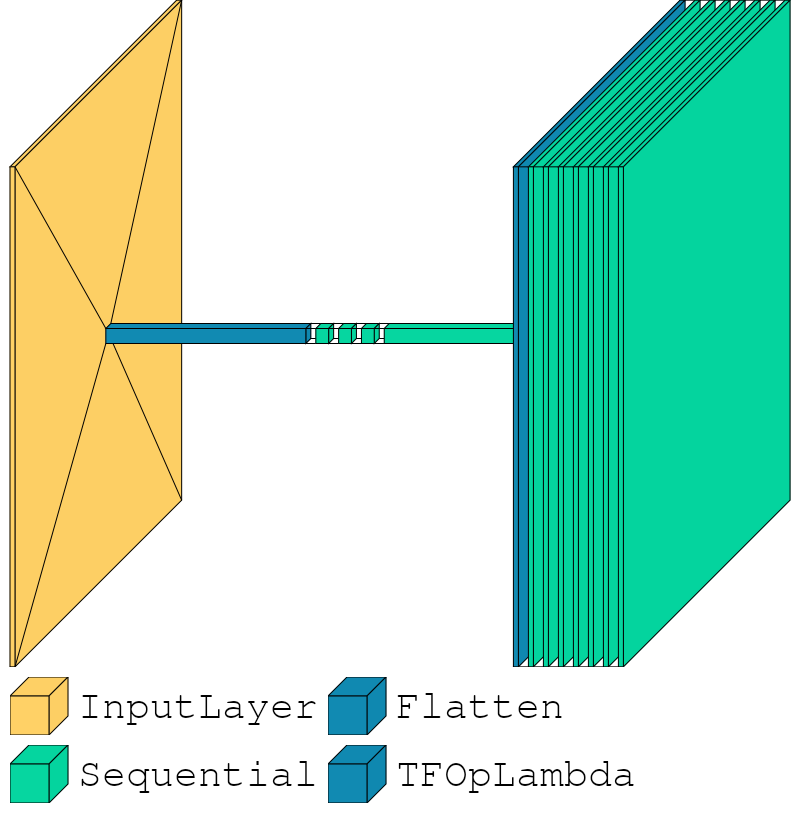

In [38]:
import visualkeras
from matplotlib import font_manager
from PIL import ImageFont
from PIL import Image
from visualkeras.utils import *
from visualkeras.layer_utils import *
system_fonts = font_manager.findSystemFonts(fontpaths=None, fontext='ttf')
font_names = font_manager.get_font_names()
working_font_names = []
for font in font_names:
    try:
        fnt = ImageFont.truetype(font, 40)
        working_font_names.append(font)
    except:
        pass
print(working_font_names)
fnt = ImageFont.truetype(working_font_names[0], 40)
# fnt = ImageFont.TransposedFont(fnt, orientation=Image.ROTATE_90)

color_dict = {'Conv2D_21': 'green', 'LeakyReLU': 'blue', 'Dropout': 'red', 'Flatten': 'yellow', 'Dense': 'orange'}
disc_shape = visualkeras.layered_view(gan_phase_object.discriminator,font = fnt, shade_step = True, draw_funnel = True, min_z = 5, max_z = 100, min_xy=15, max_xy = 500, scale_z=0.1, to_file='/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/viz_model/discriminator.tiff', color_map = color_dict, legend=True)
gen_shape = visualkeras.layered_view(gan_phase_object.generator,font = fnt, shade_step = True, draw_funnel = True, min_z = 5, max_z = 200, min_xy=15, max_xy = 500, scale_z=0.1, to_file='/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/viz_model/generator.tiff', color_map = color_dict, legend=True)
gen_shape

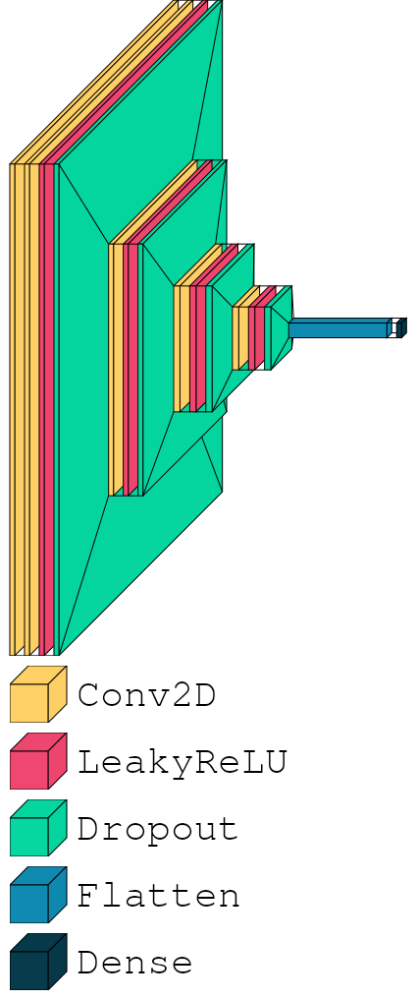

In [39]:
disc_shape

In [11]:
# r (type)                Output Shape              Param #   
# =================================================================
#  conv2d_21 (Conv2D)          (None, 128, 128, 16)      416       
                                                                 
#  conv2d_22 (Conv2D)          (None, 128, 128, 16)      6416      
                                                                 
#  leaky_re_lu_38 (LeakyReLU)  (None, 128, 128, 16)      0         
                                                                 
#  dropout_12 (Dropout)        (None, 128, 128, 16)      0         
                                                                 
#  conv2d_23 (Conv2D)          (None, 64, 64, 32)        12832     
                                                                 
#  leaky_re_lu_39 (LeakyReLU)  (None, 64, 64, 32)        0         
                                                                 
#  dropout_13 (Dropout)        (None, 64, 64, 32)        0         
                                                                 
#  conv2d_24 (Conv2D)          (None, 32, 32, 64)        18496     
                                                                 
#  leaky_re_lu_40 (LeakyReLU)  (None, 32, 32, 64)        0         
                                                                 
#  dropout_14 (Dropout)        (None, 32, 32, 64)        0         
                                                                 
#  conv2d_25 (Conv2D)          (None, 16, 16, 64)        36928     
                                                                 
#  leaky_re_lu_41 (LeakyReLU)  (None, 16, 16, 64)        0         
                                                                 
#  dropout_15 (Dropout)        (None, 16, 16, 64)        0         
                                                                 
#  flatten_3 (Flatten)         (None, 16384)             0         
                                                                 
#  dense_9 (Dense)             (None, 1)                 16385 

color_dict = {'Conv2D': 'green', 'LeakyReLU': 'blue', 'Dropout': 'red', 'Flatten': 'yellow', 'Dense': 'orange'}

rows:  1 cols:  2


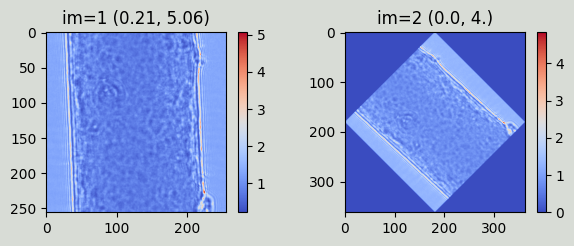

In [12]:
import os.path
import numpy as np
import cv2 as cv
from skimage import io, transform

def rotation(angle, axis):
    return np.eye(3) + np.sin(angle) * skew(axis) \
               + (1 - np.cos(angle)) * skew(axis).dot(skew(axis))

def skew(vec):
    return np.array([[0, -vec[2], vec[1]],
                     [vec[2], 0, -vec[0]],
                     [-vec[1], vec[0], 0]])

def rotate_image(imgname_in, angle, axis, imgname_out=None):
    if imgname_out is None:
        if type(imgname_in) is str:
            base, ext = os.path.splitext(imgname_in)
        else:
            base, ext = 'rotated', '.png'
        imgname_out = base + '-out' + ext
    if type(imgname_in) is str:
        img_in = io.imread(imgname_in)
    else:
        img_in = imgname_in
    img_size = img_in.shape
    #use transform to rotate the image as a 3d object with depth
    img_in = np.reshape(img_in, [img_size[0], img_size[1], 1])
    img_out = transform.rotate(img_in, angle, axis)
    visualize([img_in, img_out])
    # return img_out
    # cv.SaveImage(imgname_out, img_out)

rotate_image(image, 45, [0, 0, 1])

In [1]:
import visualkeras
from matplotlib import font_manager
from PIL import ImageFont
from PIL import Image
from visualkeras.utils import *
from visualkeras.layer_utils import *

visualkeras.layered_view(gan_phase_object.discriminator,shade_step = True, draw_funnel = True,min_z = 1, max_z = 93, min_xy=15, max_xy = 200, scale_xy=0.5, scale_z=0.01, to_file='/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/viz_model/discriminator.png', color_map = gan_phase_object.discriminator.get_config(), legend=True, padding = 30)

visualkeras.layered_view(gan_phase_object.generator,font = fnt, shade_step = True, draw_funnel = True,min_z = 1, max_z = 93, min_xy=15, max_xy = 200, scale_xy=0.5, scale_z=0.01, to_file='/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/viz_model/generator.png', color_map = gan_phase_object.generator.get_config(), legend=True, padding = 30)




# draw_volume = True
# shade_step = True
# draw_funnel = True
# min_z = 1
# max_z = 93
# min_xy = 15
# max_xy = 200
# scale_xy = 0.5
# scale_z = 0.01
# to_file = '/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/viz_model/discriminator.png'
# color_map = gan_phase_object.discriminator.get_config()
# legend = True
# padding = 30
# x_off = -1
# y_off = -1
# x = 256
# y = 256
# z = 256
# current_z = 256
# px = 256
# py = 256

# box = Box()

# box.de = 0
# if draw_volume:
#     box.de = x / 3

# if x_off == -1:
#     x_off = box.de / 2

# # top left coordinate
# box.x1 = current_z - box.de / 2
# box.y1 = box.de

# # bottom right coordinate
# box.x2 = box.x1 + z
# box.y2 = box.y1 + y

# box.shade = shade_step
# #outline
# box.outline = 'black'
# #fill with an image
# box.fill = 'white'
# box.line = 1
# #change from numpy to PIL
# box.fill = Image.fromarray([np.reshape(propagated, [px, py,1])])
# draw = aggdraw.Draw(box.fill)
# box.draw(draw)
# draw.flush()




NameError: name 'gan_phase_object' is not defined

rows:  1 cols:  2


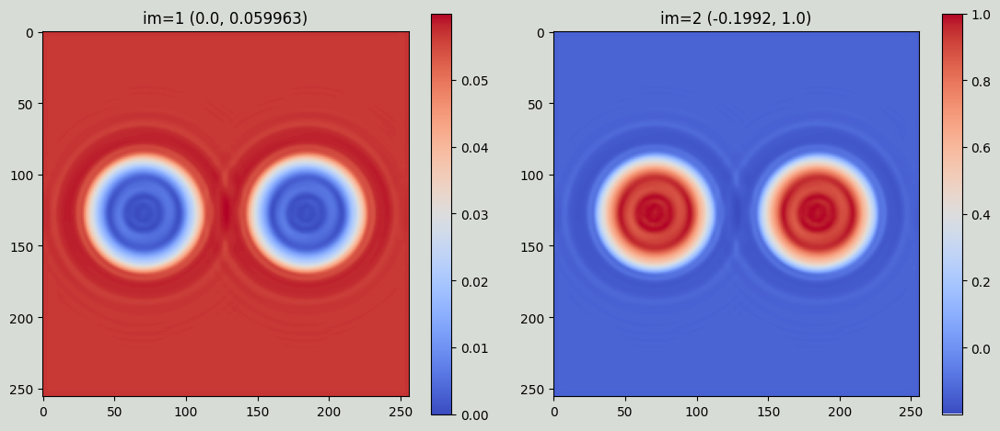

In [ ]:
visualize([absorption, 1 - (absorption/kwargs['abs_ratio']) *np.max(1 - (absorption/kwargs['abs_ratio']))])

In [ ]:
df = measure_reconstruction_quality(img1= tf_reshape(propagated), img2 = tf_reshape(propagated_images[idx][0,:,:,0]), experiment_name = 'remove the fc_'+str(kwargs["z"])+'_'+str(abs_ratio), csv_file = 'new_sphere.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count, total_time = np.sum(time_count))
display(df)

,0
experiment_name,remove the fc_0.99_0.05
iter,1000
sum of pointwise difference,-0.000148
sum of absolute value of pointwise difference,4.701394
sum of squared difference,0.314342
PSNR,[29.108377]
SSIM,[0.98858255]
NRMSE,0.560662
MSSIM,[0.9986852]
epoch_time,863.036611


# Save the phase as a video

In [ ]:

def save_as_video(side_propagation, px, py, file_name = '10000_phases.mp4', fps = 30):
    import time
    import cv2
    output_file ='/home/hailudaw/hailudaw/git_folders/ganrec/ganrectorch/output_file.mp4'
    # Stack the images into a 4D tensor
    print(len(side_propagation), side_propagation[0].shape, side_propagation[0].dtype)
    try:
        stacked_images = tf.reshape(tf.concat(side_propagation, axis=0), [len(side_propagation), 1, px, py, 1])
    except:
        try:
            stacked_images = tf.reshape(tf.stack(side_propagation), [len(side_propagation), 1, px, py, 1])
        except:
            stacked_images = tf.stack(side_propagation)
    #make the image's bounded between 0 and 255
    stacked_images = (stacked_images - tf.reduce_min(stacked_images))/(tf.reduce_max(stacked_images) - tf.reduce_min(stacked_images)) * 255
    print(stacked_images.shape, stacked_images.dtype)
    # Set the frame rate to 30 FPS
    frame_interval = 1 / fps
    # Create the video writer
    writer = tf.io.TFRecordWriter(output_file)

    # Write the images to the video file
    for i in range(stacked_images.shape[0]):
        # Encode the image as a JPEG
        image_jpeg = tf.image.encode_jpeg(tf.cast(tf.reshape(stacked_images[i][0,:,:,0], [px, py, 1]), tf.uint8))
        mean = tf.reduce_mean(stacked_images[i])
        stddev = tf.math.reduce_std(stacked_images[i])
        # Create a video frame, while adding the mean and stddev to the frame

        #add the mean and the stddev to the image
        video_frame = tf.train.SequenceExample(
            context=tf.train.Features(
                feature={
                    'image/encoded': tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_jpeg.numpy()])),
                    'image/format': tf.train.Feature(bytes_list=tf.train.BytesList(value=[b'jpeg'])),
                }
            ),
            feature_lists=tf.train.FeatureLists(
                feature_list={
                    'image/encoded': tf.train.FeatureList(feature=[
                        tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_jpeg.numpy()]))
                    ]),
                }
            )
        )
        writer.write(video_frame.SerializeToString())

        
        # Wait for the specified frame interval
        if i < stacked_images.shape[0] - 1:
            time.sleep(frame_interval)
    if os.path.exists(file_name):
        randon_number = np.random.randint(1000)

        file_name = file_name.split('.')[0] + str(randon_number) + '.mp4'
    #converting to mp4
    import subprocess 
    subprocess.run(['ffmpeg', '-i', output_file, file_name])

    # Close the video writer
    writer.close()
fps = 30
staked_images = list(np.load('/home/hailudaw/hailudaw/git_folders/ganrec/ganrectorch/video/list_propagated.npy').astype(np.float32))
save_as_video(staked_images, px, py, '/home/hailudaw/hailudaw/git_folders/ganrec/ganrectorch/video/unblur_gaussian.mp4',  fps = fps)

20 (256, 256) float32
(20, 1, 256, 256, 1) <dtype: 'float32'>


ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/beegfs/desy/user/hailudaw/anacon/envs/tf --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpost

In [ ]:
fps = 120
save_as_video(side_propagation, px, py, save_path+'with_fc_new_sphere_retrieved_%f_%fmeter_fps_%f.mp4' % (kwargs['abs_ratio'],kwargs['z'], fps), fps = fps)

In [ ]:
Image.fromarray(propagated)

ValueError: Could not save to PNG for display

<PIL.Image.Image image mode=F size=256x256>

In [ ]:
Image.fromarray(propagated)

ValueError: Could not save to PNG for display

<PIL.Image.Image image mode=F size=256x256>

In [ ]:
save_path

'/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/image/sphere_propagations'

# Direct plot of the mean, std, min, max of the phase after output of the last layer

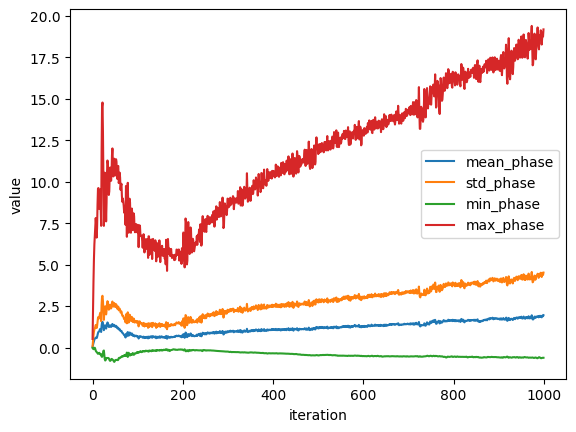

In [ ]:
#using pandas, analyze the mean, std, min, max of the side propagation
import pandas as pd
analysis = pd.DataFrame({'experiment', 'iteration', 'mean_phase', 'std_phase', 'min_phasee', 'max_phase', 'mean_abs', 'std_abs', 'min_abs', 'max_abs'})
side_propagations = side_propagation
for iter in range(len(side_propagations)):
    #fill the values in the dataframe
    new_pd = pd.DataFrame(columns=['iteration', 'mean_phase', 'std_phase', 'min_phase', 'max_phase'])
    new_pd['iteration'] = [iter]
    new_pd['mean_phase'] = [tf.math.reduce_mean(side_propagations[iter]).numpy()]
    new_pd['std_phase'] = [tf.math.reduce_std(side_propagations[iter]).numpy()]
    new_pd['min_phase'] = [tf.math.reduce_min(side_propagations[iter]).numpy()]
    new_pd['max_phase'] = [tf.math.reduce_max(side_propagations[iter]).numpy()]
    analysis = pd.concat([analysis, new_pd])
analysis.drop(analysis.columns[0], axis=1, inplace=True)
analysis.dropna(inplace=True)
analysis.to_csv('data/gan_phase/spider_abs_ratio/analysis.csv')

#graph the mean, std, min, max of the side propagation
import matplotlib.pyplot as plt
plt.figure()
plt.plot(analysis['iteration'], analysis['mean_phase'], label='mean_phase')
plt.plot(analysis['iteration'], analysis['std_phase'], label='std_phase')
plt.plot(analysis['iteration'], analysis['min_phase'], label='min_phase')
plt.plot(analysis['iteration'], analysis['max_phase'], label='max_phase')
plt.legend()
plt.xlabel('iteration')
plt.ylabel('value')
plt.savefig('sphere_analysis.png')

# Plot after normalization


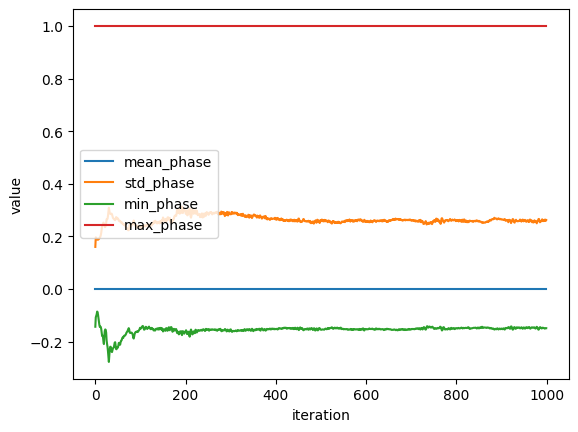

In [ ]:
#using pandas, analyze the mean, std, min, max of the side propagation
import pandas as pd
analysis = pd.DataFrame({'experiment', 'iteration', 'mean_phase', 'std_phase', 'min_phasee', 'max_phase', 'mean_abs', 'std_abs', 'min_abs', 'max_abs'})
side_propagations = side_propagation
for iter in range(len(side_propagations)):
    #fill the values in the dataframe
    new_pd = pd.DataFrame(columns=['iteration', 'mean_phase', 'std_phase', 'min_phase', 'max_phase'])
    new_pd['iteration'] = [iter]
    new_pd['mean_phase'] = [tf.math.reduce_mean(tfnor_phase(side_propagations[iter])).numpy()]
    new_pd['std_phase'] = [tf.math.reduce_std(tfnor_phase(side_propagations[iter])).numpy()]
    new_pd['min_phase'] = [tf.math.reduce_min(tfnor_phase(side_propagations[iter])).numpy()]
    new_pd['max_phase'] = [tf.math.reduce_max(tfnor_phase(side_propagations[iter])).numpy()]
    analysis = pd.concat([analysis, new_pd])
analysis.drop(analysis.columns[0], axis=1, inplace=True)
analysis.dropna(inplace=True)
analysis.to_csv('data/gan_phase/spider_abs_ratio/analysis.csv')

#graph the mean, std, min, max of the side propagation
import matplotlib.pyplot as plt
plt.figure()
plt.plot(analysis['iteration'], analysis['mean_phase'], label='mean_phase')
plt.plot(analysis['iteration'], analysis['std_phase'], label='std_phase')
plt.plot(analysis['iteration'], analysis['min_phase'], label='min_phase')
plt.plot(analysis['iteration'], analysis['max_phase'], label='max_phase')
plt.legend()
plt.xlabel('iteration')
plt.ylabel('value')
plt.savefig('sphere_analysis.png')

# The different between the normalized grouth truth phase and the retrieved phase

rows:  1 cols:  4


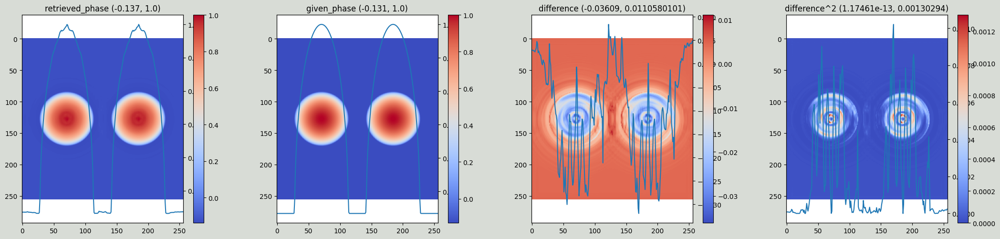

In [ ]:
f = visualize([phase, given_phase, phase-given_phase, (phase - given_phase)**2], title = ['retrieved_phase', 'given_phase', 'difference', 'difference^2'], show_or_plot = 'both', axis='on')

rows:  1 cols:  4


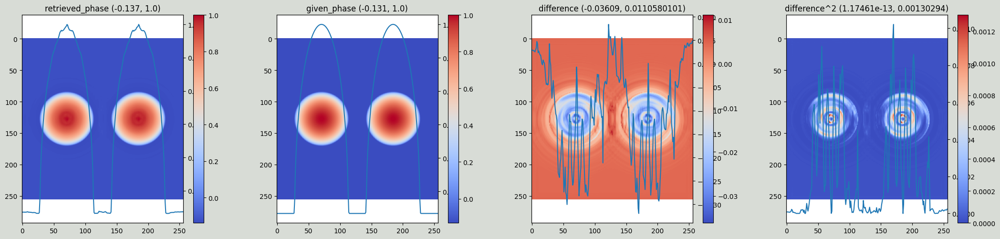

In [ ]:
f = visualize([phase, given_phase, phase-given_phase, (phase - given_phase)**2], title = ['retrieved_phase', 'given_phase', 'difference', 'difference^2'], show_or_plot = 'both', axis='on')

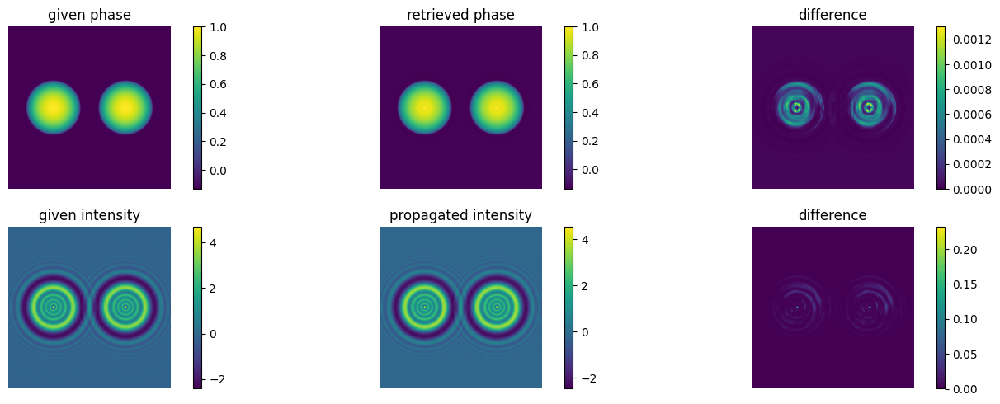

In [ ]:
#plot the given phase, the retrieved phase, and the difference between the two
# and the data, and the propagated and propagated data[idx]
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 3, figsize=(15, 5))
[axi.set_axis_off() for axi in axs.ravel()]
axs[0, 0].imshow(given_phase)
axs[0, 1].imshow(phase)
axs[0, 2].imshow((phase - given_phase)**2)
axs[0, 0].set_title('given phase')
axs[0, 1].set_title('retrieved phase')
axs[0, 2].set_title('difference')
axs[1, 0].imshow(data[0,:,:,0])
axs[1, 1].imshow(propagated)
axs[1, 2].imshow((propagated - data[0,:,:,0])**2)
axs[1, 0].set_title('given intensity')
axs[1, 1].set_title('propagated intensity')
axs[1, 2].set_title('difference')

fig.colorbar(axs[0, 0].imshow(given_phase), ax=axs[0, 0])
fig.colorbar(axs[0, 1].imshow(phase), ax=axs[0, 1])
fig.colorbar(axs[0, 2].imshow((phase - given_phase)**2), ax=axs[0, 2])
fig.colorbar(axs[1, 0].imshow(data[0,:,:,0]), ax=axs[1, 0])
fig.colorbar(axs[1, 1].imshow(propagated), ax=axs[1, 1])
fig.colorbar(axs[1, 2].imshow((propagated - data[0,:,:,0])**2), ax=axs[1, 2])

#make the figure tight
fig.tight_layout()
# colorful, don't use the pale purple
# fig.patch.set_facecolor('xkcd:pale purple')
#save the figure
save_path = save_path = "/home/hailudaw/hailudaw/git_folders/ganrec/ganrec/image/sphere_propagations"
plt.savefig(save_path+'/comparison_phase_pure_%fmeter.png' % kwargs['z'])
plt.show()




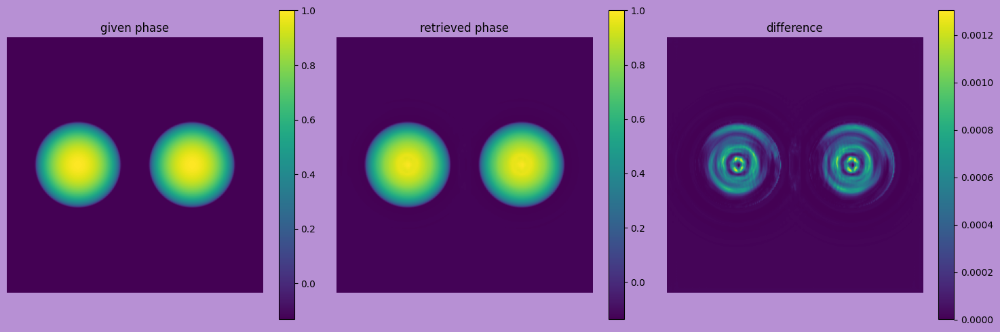

In [ ]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
[axi.set_axis_off() for axi in axs.ravel()]
axs[0].imshow(given_phase)
fig.colorbar(axs[0].imshow(given_phase), ax=axs[0])
fig.colorbar(axs[1].imshow(phase), ax=axs[1])
fig.colorbar(axs[2].imshow((phase - given_phase)**2), ax=axs[2])
#title
axs[0].set_title('given phase')
axs[1].set_title('retrieved phase')
axs[2].set_title('difference')

#make the figure tight
fig.tight_layout()
# colorful, don't use the pale purple
fig.patch.set_facecolor('xkcd:pale purple')
#save the figure
plt.savefig(save_path+'/comparison_retrieved_sphere_pure_%fmeter.png' % kwargs['z'])
plt.show()


# Qualitative analysis between the two

In [ ]:
measure_reconstruction_quality(tf_reshape(phase), tf_reshape(given_phase), experiment_name = 'sphere_pure_1m_'+str(kwargs["z"])+'_'+str(abs_ratio), csv_file = '', iteration = kwargs['iter_num'], save = False, epoch_time = time_count, total_time = np.sum(time_count))

,0
experiment_name,sphere_pure_1m_0.99_0.05
iter,1000
sum of pointwise difference,-0.000001
sum of absolute value of pointwise difference,1.49712
sum of squared difference,0.016711
PSNR,[41.85247]
SSIM,[0.9971899]
NRMSE,0.12927
MSSIM,[0.9990394]
epoch_time,863.036611


# Comparison with multiple abs_rations

In [ ]:
abs_ratio = list(np.arange(0, 5, 0.3))
different_distances = list(np.arange(0, kwargs['z']*10, 0.03))
ffs = ffactors(px * 2, py *2, kwargs['energy'], different_distances, kwargs['pv'])
given_phase = phase_image
cos, sin = np.cos(given_phase), np.sin(given_phase)
propagated_images_abs_ratio = []
idx = 30
for i in range(len(abs_ratio)):
    given_absorption = (1 - attenuation_image) * abs_ratio[i]
    given_absorption = resize(given_absorption, (px, py))
    propagated_images = [nor_phase(phase_fresnel(given_phase, given_absorption, ffs[j], px)) for j in range(len(ffs))]
    propagated_images_abs_ratio.append(propagated_images)



In [ ]:
def measure_reconstruction_quality(img1, img2, experiment_name, csv_file = None, iteration = 0, save = True, epoch_time = 0, total_time = 0):
    assert img1.shape == img2.shape, "img1 and img2 must have the same shape"
    px = img1.shape[0]
    py = img1.shape[1]
    sum_diff = tf.reduce_sum(img1 - img2)/(px*py)
    sum_abs_diff = tf.reduce_sum(tf.abs(img1 - img2))/(px*py)
    sum_squared_diff = tf.reduce_sum(tf.square(img1 - img2))/(px*py)
    psnr = tf.image.psnr(img1, img2, max_val = 1.0)
    ssim = tf.image.ssim(img1, img2, max_val = 1.0)
    nrmse = tf.math.sqrt(tf.reduce_sum(tf.square(img1 - img2))/(px*py))
    mssim = tf.image.ssim_multiscale(img1, img2, max_val = 1.0)
    values = [sum_diff, sum_abs_diff, sum_squared_diff, psnr, ssim, nrmse, mssim]
    values = [v.numpy() for v in values]
    values.insert(0, iteration)
    values.insert(0, experiment_name)
    values.append(epoch_time)
    values.append(total_time)


    import pandas as pd
    df = pd.DataFrame(values, index = ['experiment_name', 'iter', 'sum of pointwise difference', 'sum of absolute value of pointwise difference', 'sum of squared difference', 'PSNR', 'SSIM', 'NRMSE', 'MSSIM', 'epoch_time', 'total_time'])
    #transpose the dataframe
    df = df.T
    if save:
        if csv_file is not None:
            try:
                df_old = pd.read_csv(csv_file, index_col = 0)
                df = pd.concat([df_old, df], axis = 1)
            except:
                pass
            df.to_csv(csv_file)
        else:
            df.to_csv('metrics.csv')

    return df

In [ ]:
len(propagated_images_abs_ratio)

17

In [ ]:
abs_ratio = list(np.arange(0, 1.7, 0.1))
idx_props = [propagated_images_abs_ratio[i][idx] for i in range(len(abs_ratio))]
absorption_abs = []
phase_abs = []
propagated_abs = []
side_propagation_abs = []
from ganrec_dataloader import measure_reconstruction_quality, tf_reshape
for i in range(len(abs_ratio)):
    data = idx_props[i]
    kwargs['iter_num'] = 500
    abs = abs_ratio[i]
    kwargs['abs_ratio'] = abs
    kwargs['z'] = different_distances[idx]
    print('distance = ', kwargs['z'])
    kwargs['recon_monitor'] = False

    gan_phase_object = GANphase(data[0,:,:,0], **kwargs)
    start = time.time()
    absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
    end = time.time()
    time_count = end - start
    absorption_abs.append(absorption)
    phase_abs.append(phase)
    propagated_abs.append(propagated)
    side_propagation_abs.append(side_propagation)
    # visualize([absorption, phase, propagated])#, matched, data[idx], idx, abs_ratio, kwargs['iter_num'])
    df = measure_reconstruction_quality(img1= tf_reshape(propagated), img2 = tf_reshape(propagated_images[idx][0,:,:,0]), experiment_name = 'sphere_pure_1m_'+str(kwargs["z"])+'_'+str(abs), csv_file = 'spheres_abs_ratio.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count, total_time = np.sum(time_count))
    df2 = measure_reconstruction_quality(tf_reshape(phase), tf_reshape(given_phase), experiment_name = 'compare_for_diff_abs_'+str(kwargs["z"])+'_'+str(abs), csv_file = 'spheres_abs_ratio.csv', iteration = kwargs['iter_num'], save = False, epoch_time = time_count, total_time = np.sum(time_count))


distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999


ResourceExhaustedError: Graph execution error:

Detected at node 'gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput' defined at (most recent call last):
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/base_events.py", line 601, in run_forever
      self._run_once()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once
      handle._run()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3009, in run_cell
      result = self._run_cell(
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3064, in _run_cell
      result = runner(coro)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3269, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3448, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_36178/3982292722.py", line 19, in <module>
      absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
    File "/beegfs/desy/user/hailudaw/git_folders/ganrec/ganrec/ganrec1.py", line 370, in recon
      step_results = self.rec_step(i_input, ffs[0])
    File "/beegfs/desy/user/hailudaw/git_folders/ganrec/ganrec/ganrec1.py", line 260, in rec_step
Node: 'gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput'
OOM when allocating tensor with shape[1,16,256,256] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_rec_step_1136577]

In [ ]:
abs_ratio = list(np.arange(0, 1.7, 0.1))
idx_props = [propagated_images_abs_ratio[i][idx] for i in range(len(abs_ratio))]
absorption_abs = []
phase_abs = []
propagated_abs = []
side_propagation_abs = []
from ganrec_dataloader import measure_reconstruction_quality, tf_reshape
for i in range(len(abs_ratio)):
    data = idx_props[i]
    kwargs['iter_num'] = 500
    abs = abs_ratio[i]
    kwargs['abs_ratio'] = abs
    kwargs['z'] = different_distances[idx]
    print('distance = ', kwargs['z'])
    kwargs['recon_monitor'] = False

    gan_phase_object = GANphase(data[0,:,:,0], **kwargs)
    start = time.time()
    absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
    end = time.time()
    time_count = end - start
    absorption_abs.append(absorption)
    phase_abs.append(phase)
    propagated_abs.append(propagated)
    side_propagation_abs.append(side_propagation)
    # visualize([absorption, phase, propagated])#, matched, data[idx], idx, abs_ratio, kwargs['iter_num'])
    df = measure_reconstruction_quality(img1= tf_reshape(propagated), img2 = tf_reshape(propagated_images[idx][0,:,:,0]), experiment_name = 'sphere_pure_1m_'+str(kwargs["z"])+'_'+str(abs), csv_file = 'spheres_abs_ratio.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count, total_time = np.sum(time_count))
    df2 = measure_reconstruction_quality(tf_reshape(phase), tf_reshape(given_phase), experiment_name = 'compare_for_diff_abs_'+str(kwargs["z"])+'_'+str(abs), csv_file = 'spheres_abs_ratio.csv', iteration = kwargs['iter_num'], save = False, epoch_time = time_count, total_time = np.sum(time_count))


distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999


ResourceExhaustedError: Graph execution error:

Detected at node 'gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput' defined at (most recent call last):
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/base_events.py", line 601, in run_forever
      self._run_once()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once
      handle._run()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3009, in run_cell
      result = self._run_cell(
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3064, in _run_cell
      result = runner(coro)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3269, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3448, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_36178/3982292722.py", line 19, in <module>
      absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
    File "/beegfs/desy/user/hailudaw/git_folders/ganrec/ganrec/ganrec1.py", line 370, in recon
      step_results = self.rec_step(i_input, ffs[0])
    File "/beegfs/desy/user/hailudaw/git_folders/ganrec/ganrec/ganrec1.py", line 260, in rec_step
Node: 'gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput'
OOM when allocating tensor with shape[1,16,256,256] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_rec_step_1136577]

In [ ]:
abs_ratio = list(np.arange(0, 1.7, 0.1))
idx_props = [propagated_images_abs_ratio[i][idx] for i in range(len(abs_ratio))]
absorption_abs = []
phase_abs = []
propagated_abs = []
side_propagation_abs = []
from ganrec_dataloader import measure_reconstruction_quality, tf_reshape
for i in range(len(abs_ratio)):
    data = idx_props[i]
    kwargs['iter_num'] = 500
    abs = abs_ratio[i]
    kwargs['abs_ratio'] = abs
    kwargs['z'] = different_distances[idx]
    print('distance = ', kwargs['z'])
    kwargs['recon_monitor'] = False

    gan_phase_object = GANphase(data[0,:,:,0], **kwargs)
    start = time.time()
    absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
    end = time.time()
    time_count = end - start
    absorption_abs.append(absorption)
    phase_abs.append(phase)
    propagated_abs.append(propagated)
    side_propagation_abs.append(side_propagation)
    # visualize([absorption, phase, propagated])#, matched, data[idx], idx, abs_ratio, kwargs['iter_num'])
    df = measure_reconstruction_quality(img1= tf_reshape(propagated), img2 = tf_reshape(propagated_images[idx][0,:,:,0]), experiment_name = 'sphere_pure_1m_'+str(kwargs["z"])+'_'+str(abs), csv_file = 'spheres_abs_ratio.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count, total_time = np.sum(time_count))
    df2 = measure_reconstruction_quality(tf_reshape(phase), tf_reshape(given_phase), experiment_name = 'compare_for_diff_abs_'+str(kwargs["z"])+'_'+str(abs), csv_file = 'spheres_abs_ratio.csv', iteration = kwargs['iter_num'], save = False, epoch_time = time_count, total_time = np.sum(time_count))


distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999


ResourceExhaustedError: Graph execution error:

Detected at node 'gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput' defined at (most recent call last):
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/base_events.py", line 601, in run_forever
      self._run_once()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once
      handle._run()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3009, in run_cell
      result = self._run_cell(
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3064, in _run_cell
      result = runner(coro)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3269, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3448, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_36178/3982292722.py", line 19, in <module>
      absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
    File "/beegfs/desy/user/hailudaw/git_folders/ganrec/ganrec/ganrec1.py", line 370, in recon
      step_results = self.rec_step(i_input, ffs[0])
    File "/beegfs/desy/user/hailudaw/git_folders/ganrec/ganrec/ganrec1.py", line 260, in rec_step
Node: 'gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput'
OOM when allocating tensor with shape[1,16,256,256] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_rec_step_1136577]

In [ ]:
abs_ratio = list(np.arange(0, 1.7, 0.1))
idx_props = [propagated_images_abs_ratio[i][idx] for i in range(len(abs_ratio))]
absorption_abs = []
phase_abs = []
propagated_abs = []
side_propagation_abs = []
from ganrec_dataloader import measure_reconstruction_quality, tf_reshape
for i in range(len(abs_ratio)):
    data = idx_props[i]
    kwargs['iter_num'] = 500
    abs = abs_ratio[i]
    kwargs['abs_ratio'] = abs
    kwargs['z'] = different_distances[idx]
    print('distance = ', kwargs['z'])
    kwargs['recon_monitor'] = False

    gan_phase_object = GANphase(data[0,:,:,0], **kwargs)
    start = time.time()
    absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
    end = time.time()
    time_count = end - start
    absorption_abs.append(absorption)
    phase_abs.append(phase)
    propagated_abs.append(propagated)
    side_propagation_abs.append(side_propagation)
    # visualize([absorption, phase, propagated])#, matched, data[idx], idx, abs_ratio, kwargs['iter_num'])
    df = measure_reconstruction_quality(img1= tf_reshape(propagated), img2 = tf_reshape(propagated_images[idx][0,:,:,0]), experiment_name = 'sphere_pure_1m_'+str(kwargs["z"])+'_'+str(abs), csv_file = 'spheres_abs_ratio.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count, total_time = np.sum(time_count))
    df2 = measure_reconstruction_quality(tf_reshape(phase), tf_reshape(given_phase), experiment_name = 'compare_for_diff_abs_'+str(kwargs["z"])+'_'+str(abs), csv_file = 'spheres_abs_ratio.csv', iteration = kwargs['iter_num'], save = False, epoch_time = time_count, total_time = np.sum(time_count))


distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999


ResourceExhaustedError: Graph execution error:

Detected at node 'gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput' defined at (most recent call last):
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/base_events.py", line 601, in run_forever
      self._run_once()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once
      handle._run()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3009, in run_cell
      result = self._run_cell(
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3064, in _run_cell
      result = runner(coro)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3269, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3448, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_36178/3982292722.py", line 19, in <module>
      absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
    File "/beegfs/desy/user/hailudaw/git_folders/ganrec/ganrec/ganrec1.py", line 370, in recon
      step_results = self.rec_step(i_input, ffs[0])
    File "/beegfs/desy/user/hailudaw/git_folders/ganrec/ganrec/ganrec1.py", line 260, in rec_step
Node: 'gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput'
OOM when allocating tensor with shape[1,16,256,256] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_rec_step_1136577]

In [ ]:
abs_ratio = list(np.arange(0, 1.7, 0.1))
idx_props = [propagated_images_abs_ratio[i][idx] for i in range(len(abs_ratio))]
absorption_abs = []
phase_abs = []
propagated_abs = []
side_propagation_abs = []
from ganrec_dataloader import measure_reconstruction_quality, tf_reshape
for i in range(len(abs_ratio)):
    data = idx_props[i]
    kwargs['iter_num'] = 500
    abs = abs_ratio[i]
    kwargs['abs_ratio'] = abs
    kwargs['z'] = different_distances[idx]
    print('distance = ', kwargs['z'])
    kwargs['recon_monitor'] = False

    gan_phase_object = GANphase(data[0,:,:,0], **kwargs)
    start = time.time()
    absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
    end = time.time()
    time_count = end - start
    absorption_abs.append(absorption)
    phase_abs.append(phase)
    propagated_abs.append(propagated)
    side_propagation_abs.append(side_propagation)
    # visualize([absorption, phase, propagated])#, matched, data[idx], idx, abs_ratio, kwargs['iter_num'])
    df = measure_reconstruction_quality(img1= tf_reshape(propagated), img2 = tf_reshape(propagated_images[idx][0,:,:,0]), experiment_name = 'sphere_pure_1m_'+str(kwargs["z"])+'_'+str(abs), csv_file = 'spheres_abs_ratio.csv', iteration = kwargs['iter_num'], save = True, epoch_time = time_count, total_time = np.sum(time_count))
    df2 = measure_reconstruction_quality(tf_reshape(phase), tf_reshape(given_phase), experiment_name = 'compare_for_diff_abs_'+str(kwargs["z"])+'_'+str(abs), csv_file = 'spheres_abs_ratio.csv', iteration = kwargs['iter_num'], save = False, epoch_time = time_count, total_time = np.sum(time_count))


distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999
distance =  0.8999999999999999


ResourceExhaustedError: Graph execution error:

Detected at node 'gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput' defined at (most recent call last):
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/base_events.py", line 601, in run_forever
      self._run_once()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once
      handle._run()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3009, in run_cell
      result = self._run_cell(
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3064, in _run_cell
      result = runner(coro)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3269, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3448, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/beegfs/desy/user/hailudaw/anacon/envs/tf/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_36178/3982292722.py", line 19, in <module>
      absorption, phase,propagated, loss, side_propagation  = gan_phase_object.recon
    File "/beegfs/desy/user/hailudaw/git_folders/ganrec/ganrec/ganrec1.py", line 370, in recon
      step_results = self.rec_step(i_input, ffs[0])
    File "/beegfs/desy/user/hailudaw/git_folders/ganrec/ganrec/ganrec1.py", line 260, in rec_step
Node: 'gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput'
OOM when allocating tensor with shape[1,16,256,256] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node gradient_tape/sequential_449/conv2d_322/Conv2D_1/Conv2DBackpropInput}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_rec_step_1136577]

,experiment_name,iter,sum of pointwise difference,sum of absolute value of pointwise difference,sum of squared difference,PSNR,SSIM,NRMSE,MSSIM,epoch_time,total_time
0.8,sphere_pure_1m_0.8999999999999999_0.0,1000,0.00064122677,312.9166,815.07745,[-2.019289],[0.00227537],28.54956,[0.43662405],58.603089332580566,58.603089332580566
0.9,sphere_pure_1m_0.8999999999999999_0.3,1000,-2.2485852e-05,115.38768,101.47787,[7.028986],[0.6044832],10.073623,[0.7731662],57.465049505233765,57.465049505233765
0.10,sphere_pure_1m_0.8999999999999999_0.6,1000,-3.685057e-05,96.43153,68.27931,[8.749808],[0.66432565],8.263129,[0.84680027],54.50755596160889,54.50755596160889
0.11,sphere_pure_1m_0.8999999999999999_0.8999999999...,1000,-2.580136e-05,71.79477,36.122517,[11.514919],[0.87261266],6.010201,[0.91963184],58.90885853767395,58.90885853767395
0.12,sphere_pure_1m_0.8999999999999999_1.2,1000,1.5944242e-06,43.822777,13.715542,[15.72057],[0.8787512],3.70345,[0.95326144],60.00023579597473,60.00023579597473
0.13,sphere_pure_1m_0.8999999999999999_1.5,1000,-1.2859702e-05,17.83593,2.2420607,[23.586226],[0.9669596],1.4973513,[0.98620564],60.2374906539917,60.2374906539917
0.14,sphere_pure_1m_0.8999999999999999_1.7999999999...,1000,-8.754432e-06,9.017944,4.477146,[20.582685],[0.81453484],2.1159267,[0.9665034],57.09895420074463,57.09895420074463
0.15,sphere_pure_1m_0.8999999999999999_0.0,1000,0.000313282,312.50174,814.34784,[-2.0154],[0.00265839],28.536781,[0.43758574],63.01763987541199,63.01763987541199
0.16,sphere_pure_1m_0.8999999999999999_0.3,1000,-2.2277236e-05,115.49617,101.29744,[7.0367146],[0.7214231],10.064663,[0.7982831],59.84878158569336,59.84878158569336
0.17,sphere_pure_1m_0.8999999999999999_0.6,1000,-4.0858984e-05,96.76874,67.0323,[8.829858],[0.80801386],8.1873255,[0.8703667],59.31052851676941,59.31052851676941


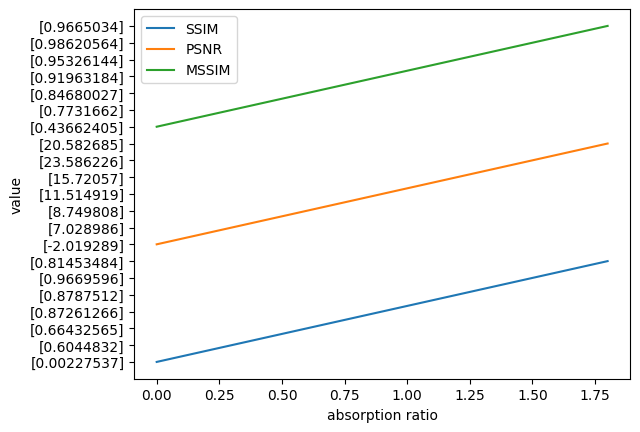

In [ ]:
#load the pd /home/hailudaw/hailudaw/git_folders/ganrec/ganrec/spheres.ipynb
import pandas as pd
df_all = pd.read_csv('spheres_abs_ratio.csv', index_col = 0).T
df_all = df_all[df_all['iter'] == str(1000)] 
display(df_all)
#remove duplicatesf
df_all = df_all.drop_duplicates(subset=['experiment_name'])
x_label = abs_ratio 
y1_label = df_all['SSIM'].values
y2_label = df_all['PSNR'].values
y4_label = df_all['MSSIM'].values
#plot the ssim, psnr, mssim
import matplotlib.pyplot as plt
plt.figure()
plt.plot(x_label, y1_label, label='SSIM')
plt.plot(x_label, y2_label, label='PSNR')
plt.plot(x_label, y4_label, label='MSSIM')
plt.legend()
plt.xlabel('absorption ratio')
plt.ylabel('value')
plt.savefig(save_path+'/plot_sphere_abs_ratio.png')
plt.show()



In [ ]:
y_label

array(['[0.00227537]', '[0.6044832]', '[0.66432565]', '[0.87261266]',
       '[0.8787512]', '[0.9669596]', '[0.81453484]'], dtype=object)